In [1]:
import tensorflow as tf

# Pastikan menggunakan session dengan benar jika menggunakan TensorFlow 1.x
sess = tf.compat.v1.Session()
sess.run(tf.compat.v1.global_variables_initializer())


### Import libs

In [2]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import random
import pprint
import sys
import time
import numpy as np
from optparse import OptionParser
import pickle
import math
import cv2
import copy
from matplotlib import pyplot as plt
import tensorflow as tf
import pandas as pd
import os
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import os

from sklearn.metrics import average_precision_score

from keras import backend as K
from keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Flatten, Dense, Input, Conv2D, MaxPooling2D, Dropout
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, TimeDistributed
from keras.engine.topology import get_source_inputs
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.objectives import categorical_crossentropy

from keras.models import Model
from keras.utils import generic_utils
from keras.engine import Layer, InputSpec
from keras import initializers, regularizers

C:\Users\Lenovo\Documents\TA-2025-01\frrcnn_b\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using TensorFlow backend.


#### Config setting

In [3]:
class Config:
    def __init__(self):
        self.verbose = True
        self.network = 'vgg'

        # Menghilangkan augmentasi (sudah dilakukan sebelumnya)
        self.use_horizontal_flips = False
        self.use_vertical_flips = False
        self.rot_90 = False

        # Rasio anchor disesuaikan dengan dataset wide format (930×281)
        self.anchor_box_ratios = [[1, 1], [3, 1], [1, 3]]

        # Standar untuk VGG16 pre-trained
        self.img_channel_mean = [103.939, 116.779, 123.68]
        self.img_scaling_factor = 1.0

        # Parameter utama - disesuaikan untuk 930x281
        self.num_rois = 32  # Meningkatkan dari nilai default
        self.pool_size = 7

        # Menurunkan threshold IoU drastis untuk mendapatkan lebih banyak sampel
        self.rpn_min_overlap = 0.05  # Jauh lebih kecil dari default
        self.rpn_max_overlap = 0.4
        self.classifier_min_overlap = 0.05
        self.classifier_max_overlap = 0.4

        self.balanced_classes = False
        self.std_scaling = 4.0
        self.classifier_regr_std = [8.0, 8.0, 4.0, 4.0]

        self.class_mapping = None
        self.model_path = None

        # FPN config
        self.use_fpn = True
        self.fpn_pyramid_levels = ["P2", "P3", "P4", "P5"]
        self.rpn_strides = {"P2": 4, "P3": 8, "P4": 16, "P5": 32}

        # Anchor scales yang lebih variatif
        self.anchor_box_scales = {
             'P2': [16, 32, 64, 128],  # Untuk deteksi objek kecil
             'P3': [32, 64, 128, 256],
             'P4': [64, 128, 256, 512],
             'P5': [128, 256, 512, 1024]  # Untuk deteksi objek besar
        }

        if self.use_fpn:
            self.num_anchors = sum(len(scales) * len(self.anchor_box_ratios) for scales in self.anchor_box_scales.values())
        else:
            self.num_anchors = len(self.anchor_box_scales) * len(self.anchor_box_ratios)


#### Parser the data from annotation file

In [4]:
def get_data(input_path):
    found_bg = False
    all_imgs = {}
    classes_count = {}
    class_mapping = {}
    i = 1

    with open(input_path, 'r') as f:
        print('Parsing annotation files')
        for line in f:
            sys.stdout.write('\r' + 'idx=' + str(i))
            i += 1
            line_split = line.strip().split(',')
            (filename, x1, y1, x2, y2, class_name) = line_split

            if class_name not in classes_count:
                classes_count[class_name] = 1
            else:
                classes_count[class_name] += 1

            if class_name not in class_mapping:
                if class_name == 'bg' and not found_bg:
                    print('Found bg class, setting as background.')
                    found_bg = True
                class_mapping[class_name] = len(class_mapping)

            if filename not in all_imgs:
                all_imgs[filename] = {}
                img = cv2.imread(filename)
                (rows, cols) = img.shape[:2]
                all_imgs[filename]['filepath'] = filename
                all_imgs[filename]['width'] = cols
                all_imgs[filename]['height'] = rows
                all_imgs[filename]['bboxes'] = []

            all_imgs[filename]['bboxes'].append({
                'class': class_name, 'x1': int(x1), 'y1': int(y1), 'x2': int(x2), 'y2': int(y2)
            })

    return list(all_imgs.values()), classes_count, class_mapping


In [5]:
all_imgs, classes_count, class_mapping = get_data("C:/Users/Lenovo/Documents/TA-2025-01/train annotation_normalized4.txt")

# Debugging untuk memastikan class_mapping tetap benar
print(" Isi class_mapping sebelum digunakan:", class_mapping)


Parsing annotation files
idx=1759 Isi class_mapping sebelum digunakan: {'Mobil': 0}


#### Define ROI Pooling Convolutional Layer

In [6]:
class RoiPoolingConv(Layer):
    """ROI pooling layer untuk klasifikasi dan regresi bounding box."""
    def __init__(self, pool_size, num_rois, **kwargs):
        self.dim_ordering = 'channels_last'
        self.pool_size = pool_size
        self.num_rois = num_rois
        super(RoiPoolingConv, self).__init__(**kwargs)

    def build(self, input_shape):
        self.nb_channels = input_shape[0][3]

    def compute_output_shape(self, input_shape):
        return None, self.num_rois, self.pool_size, self.pool_size, self.nb_channels

    def call(self, x, mask=None):
        assert(len(x) == 2)

        # x[0] adalah feature map dari ConvNet
        # x[1] adalah tensor ROI dengan shape (1, num_rois, 4)
        feature_map = x[0]
        rois = x[1][0]

        # Dapatkan dimensi feature map
        feature_shape = tf.shape(feature_map)
        batch_size = feature_shape[0]
        feature_h = feature_shape[1]
        feature_w = feature_shape[2]
        num_channels = feature_shape[3]

        # Siapkan output dengan ukuran yang benar
        outputs = []

        # Buat "fallback" region yang pasti valid - sebuah region 3x3 di tengah feature map
        mid_h = feature_h // 2
        mid_w = feature_w // 2
        safe_h = tf.maximum(3, feature_h // 10)  # minimal 3 pixel atau 10% feature height
        safe_w = tf.maximum(3, feature_w // 10)  # minimal 3 pixel atau 10% feature width

        # Ambil region di tengah sebagai fallback
        fallback_region = feature_map[:, 
                                     mid_h-safe_h//2:mid_h+safe_h//2, 
                                     mid_w-safe_w//2:mid_w+safe_w//2, 
                                     :]

        for roi_idx in range(self.num_rois):
            # Konversi koordinat ROI
            x1 = tf.cast(rois[roi_idx, 0], 'int32')
            y1 = tf.cast(rois[roi_idx, 1], 'int32')
            x2 = tf.cast(rois[roi_idx, 2], 'int32')
            y2 = tf.cast(rois[roi_idx, 3], 'int32')

            # Pastikan koordinat terletak dalam feature map
            x1 = tf.maximum(0, x1)
            y1 = tf.maximum(0, y1)
            x2 = tf.minimum(feature_w - 1, x2)
            y2 = tf.minimum(feature_h - 1, y2)

            # Hitung width dan height
            w = x2 - x1 + 1
            h = y2 - y1 + 1

            # VALIDASI UKURAN: Pastikan region memiliki luas minimal
            valid_roi = tf.logical_and(tf.greater(w, 0), tf.greater(h, 0))

            # Gunakan tf.cond untuk menangani region valid/tidak valid
            def true_fn():
                # Bila region valid, lakukan pooling dari feature map
                region = feature_map[:, y1:y1+h, x1:x1+w, :]
                # Deteksi ukuran region setelah slicing
                region_shape = tf.shape(region)
                region_h = region_shape[1]
                region_w = region_shape[2]

                # Validasi ukuran region setelah slicing
                valid_after_slice = tf.logical_and(
                    tf.greater(region_h, 0), 
                    tf.greater(region_w, 0)
                )

                # Nested cond untuk memeriksa validitas setelah slicing
                def slice_valid_fn():
                    return tf.image.resize(
                        region, 
                        (self.pool_size, self.pool_size),
                        method='bilinear'
                    )

                def slice_invalid_fn():
                    # Gunakan fallback region jika slicing menghasilkan region invalid
                    return tf.image.resize(
                        fallback_region, 
                        (self.pool_size, self.pool_size),
                        method='bilinear'
                    )

                return tf.cond(valid_after_slice, slice_valid_fn, slice_invalid_fn)

            def false_fn():
                # Bila region tidak valid, gunakan fallback region
                return tf.image.resize(
                    fallback_region,
                    (self.pool_size, self.pool_size),
                    method='bilinear'
                )

            # Pilih fungsi yang sesuai berdasarkan validitas ROI
            resized = tf.cond(valid_roi, true_fn, false_fn)
            outputs.append(resized)

        # Gabungkan semua ROI
        final_output = tf.concat(outputs, axis=0)
        final_output = tf.reshape(
            final_output, 
            (1, self.num_rois, self.pool_size, self.pool_size, self.nb_channels)
        )

        return final_output


#### Vgg 16

In [7]:
def get_img_output_length(width, height):
    def get_output_length(input_length):
        return input_length//16

    return get_output_length(width), get_output_length(height)    

def nn_base(input_tensor=None, trainable=False):


    input_shape = (None, None, 3)

    if input_tensor is None:
        img_input = Input(shape=input_shape)
    else:
        if not K.is_keras_tensor(input_tensor):
            img_input = Input(tensor=input_tensor, shape=input_shape)
        else:
            img_input = input_tensor

    bn_axis = 3

    # Block 1
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv1')(img_input)
    x = Conv2D(64, (3, 3), activation='relu', padding='same', name='block1_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool')(x)

    # Block 2
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv1')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same', name='block2_conv2')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool')(x)

    # Block 3
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv1')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv2')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block3_pool')(x)

    # Block 4
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block4_conv3')(x)
    x = MaxPooling2D((2, 2), strides=(2, 2), name='block4_pool')(x)

    # Block 5
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv1')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv2')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same', name='block5_conv3')(x)
    # x = MaxPooling2D((2, 2), strides=(2, 2), name='block5_pool')(x)

    return x

####  RPN layer

In [8]:
def rpn_layer(base_layers, num_anchors):
    """Create a rpn layer
        Step1: Pass through the feature map from base layer to a 3x3 512 channels convolutional layer
                Keep the padding 'same' to preserve the feature map's size
        Step2: Pass the step1 to two (1,1) convolutional layer to replace the fully connected layer
                classification layer: num_anchors (9 in here) channels for 0, 1 sigmoid activation output
                regression layer: num_anchors*4 (36 in here) channels for computing the regression of bboxes with linear activation
    Args:
        base_layers: vgg in here
        num_anchors: 9 in here

    Returns:
        [x_class, x_regr, base_layers]
        x_class: classification for whether it's an object
        x_regr: bboxes regression
        base_layers: vgg in here
    """
    x = Conv2D(512, (3, 3), padding='same', activation='relu', kernel_initializer='normal', name='rpn_conv1')(base_layers)

    x_class = Conv2D(num_anchors, (1, 1), activation='sigmoid', kernel_initializer='uniform', name='rpn_out_class')(x)
    x_regr = Conv2D(num_anchors * 4, (1, 1), activation='linear', kernel_initializer='zero', name='rpn_out_regress')(x)

    return [x_class, x_regr, base_layers]

####  Classifier layer

In [9]:
def classifier_layer(base_layers, input_rois, num_rois, nb_classes = 4):
    """Create a classifier layer
    
    Args:
        base_layers: vgg
        input_rois: `(1,num_rois,4)` list of rois, with ordering (x,y,w,h)
        num_rois: number of rois to be processed in one time (4 in here)

    Returns:
        list(out_class, out_regr)
        out_class: classifier layer output
        out_regr: regression layer output
    """

    input_shape = (num_rois,7,7,512)

    pooling_regions = 7

    # out_roi_pool.shape = (1, num_rois, channels, pool_size, pool_size)
    # num_rois (4) 7x7 roi pooling
    out_roi_pool = RoiPoolingConv(pooling_regions, num_rois)([base_layers, input_rois])

    # Flatten the convlutional layer and connected to 2 FC and 2 dropout
    out = TimeDistributed(Flatten(name='flatten'))(out_roi_pool)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc1'))(out)
    out = TimeDistributed(Dropout(0.5))(out)
    out = TimeDistributed(Dense(4096, activation='relu', name='fc2'))(out)
    out = TimeDistributed(Dropout(0.5))(out)

    # There are two output layer
    # out_class: softmax acivation function for classify the class name of the object
    # out_regr: linear activation function for bboxes coordinates regression
    out_class = TimeDistributed(Dense(nb_classes, activation='softmax', kernel_initializer='zero'), name='dense_class_{}'.format(nb_classes))(out)
    # note: no regression target for bg class
    out_regr = TimeDistributed(Dense(4 * (nb_classes-1), activation='linear', kernel_initializer='zero'), name='dense_regress_{}'.format(nb_classes))(out)

    return [out_class, out_regr]

#### Calculate IoU (Intersection of Union)

In [10]:
def union(au, bu, area_intersection):
	area_a = (au[2] - au[0]) * (au[3] - au[1])
	area_b = (bu[2] - bu[0]) * (bu[3] - bu[1])
	area_union = area_a + area_b - area_intersection
	return area_union


def intersection(ai, bi):
	x = max(ai[0], bi[0])
	y = max(ai[1], bi[1])
	w = min(ai[2], bi[2]) - x
	h = min(ai[3], bi[3]) - y
	if w < 0 or h < 0:
		return 0
	return w*h


def iou(a, b):
	# a and b should be (x1,y1,x2,y2)

	if a[0] >= a[2] or a[1] >= a[3] or b[0] >= b[2] or b[1] >= b[3]:
		return 0.0

	area_i = intersection(a, b)
	area_u = union(a, b, area_i)

	return float(area_i) / float(area_u + 1e-6)

#### Calculate the rpn for all anchors of all images

In [11]:
def calc_rpn(C, img_data, width, height, resized_width, resized_height, img_length_calc_function):
	"""(Important part!) Calculate the rpn for all anchors 
		If feature map has shape 38x50=1900, there are 1900x9=17100 potential anchors
	
	Args:
		C: config
		img_data: augmented image data
		width: original image width (e.g. 600)
		height: original image height (e.g. 800)
		resized_width: resized image width according to C.im_size (e.g. 300)
		resized_height: resized image height according to C.im_size (e.g. 400)
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size

	Returns:
		y_rpn_cls: list(num_bboxes, y_is_box_valid + y_rpn_overlap)
			y_is_box_valid: 0 or 1 (0 means the box is invalid, 1 means the box is valid)
			y_rpn_overlap: 0 or 1 (0 means the box is not an object, 1 means the box is an object)
		y_rpn_regr: list(num_bboxes, 4*y_rpn_overlap + y_rpn_regr)
			y_rpn_regr: x1,y1,x2,y2 bunding boxes coordinates
	"""
	downscale = float(C.rpn_stride) 
	anchor_sizes = C.anchor_box_scales   # 128, 256, 512
	anchor_ratios = C.anchor_box_ratios  # 1:1, 1:2*sqrt(2), 2*sqrt(2):1
	num_anchors = len(anchor_sizes) * len(anchor_ratios) # 3x3=9

	# calculate the output map size based on the network architecture
	(output_width, output_height) = img_length_calc_function(resized_width, resized_height)

	n_anchratios = len(anchor_ratios)    # 3
	
	# initialise empty output objectives
	y_rpn_overlap = np.zeros((output_height, output_width, num_anchors))
	y_is_box_valid = np.zeros((output_height, output_width, num_anchors))
	y_rpn_regr = np.zeros((output_height, output_width, num_anchors * 4))

	num_bboxes = len(img_data['bboxes'])

	num_anchors_for_bbox = np.zeros(num_bboxes).astype(int)
	best_anchor_for_bbox = -1*np.ones((num_bboxes, 4)).astype(int)
	best_iou_for_bbox = np.zeros(num_bboxes).astype(np.float32)
	best_x_for_bbox = np.zeros((num_bboxes, 4)).astype(int)
	best_dx_for_bbox = np.zeros((num_bboxes, 4)).astype(np.float32)

	# get the GT box coordinates, and resize to account for image resizing
	gta = np.zeros((num_bboxes, 4))
	for bbox_num, bbox in enumerate(img_data['bboxes']):
		# get the GT box coordinates, and resize to account for image resizing
		gta[bbox_num, 0] = bbox['x1'] * (resized_width / float(width))
		gta[bbox_num, 1] = bbox['x2'] * (resized_width / float(width))
		gta[bbox_num, 2] = bbox['y1'] * (resized_height / float(height))
		gta[bbox_num, 3] = bbox['y2'] * (resized_height / float(height))
	
	# rpn ground truth

	for anchor_size_idx in range(len(anchor_sizes)):
		for anchor_ratio_idx in range(n_anchratios):
			anchor_x = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][0]
			anchor_y = anchor_sizes[anchor_size_idx] * anchor_ratios[anchor_ratio_idx][1]	
			
			for ix in range(output_width):					
				# x-coordinates of the current anchor box	
				x1_anc = downscale * (ix + 0.5) - anchor_x / 2
				x2_anc = downscale * (ix + 0.5) + anchor_x / 2	
				
				# ignore boxes that go across image boundaries					
				if x1_anc < 0 or x2_anc > resized_width:
					continue
					
				for jy in range(output_height):

					# y-coordinates of the current anchor box
					y1_anc = downscale * (jy + 0.5) - anchor_y / 2
					y2_anc = downscale * (jy + 0.5) + anchor_y / 2

					# ignore boxes that go across image boundaries
					if y1_anc < 0 or y2_anc > resized_height:
						continue

					# bbox_type indicates whether an anchor should be a target
					# Initialize with 'negative'
					bbox_type = 'neg'

					# this is the best IOU for the (x,y) coord and the current anchor
					# note that this is different from the best IOU for a GT bbox
					best_iou_for_loc = 0.0

					for bbox_num in range(num_bboxes):
						
						# get IOU of the current GT box and the current anchor box
						curr_iou = iou([gta[bbox_num, 0], gta[bbox_num, 2], gta[bbox_num, 1], gta[bbox_num, 3]], [x1_anc, y1_anc, x2_anc, y2_anc])
						# calculate the regression targets if they will be needed
						if curr_iou > best_iou_for_bbox[bbox_num] or curr_iou > C.rpn_max_overlap:
							cx = (gta[bbox_num, 0] + gta[bbox_num, 1]) / 2.0
							cy = (gta[bbox_num, 2] + gta[bbox_num, 3]) / 2.0
							cxa = (x1_anc + x2_anc)/2.0
							cya = (y1_anc + y2_anc)/2.0

							# x,y are the center point of ground-truth bbox
							# xa,ya are the center point of anchor bbox (xa=downscale * (ix + 0.5); ya=downscale * (iy+0.5))
							# w,h are the width and height of ground-truth bbox
							# wa,ha are the width and height of anchor bboxe
							# tx = (x - xa) / wa
							# ty = (y - ya) / ha
							# tw = log(w / wa)
							# th = log(h / ha)
							tx = (cx - cxa) / (x2_anc - x1_anc)
							ty = (cy - cya) / (y2_anc - y1_anc)
							tw = np.log((gta[bbox_num, 1] - gta[bbox_num, 0]) / (x2_anc - x1_anc))
							th = np.log((gta[bbox_num, 3] - gta[bbox_num, 2]) / (y2_anc - y1_anc))
						
						if img_data['bboxes'][bbox_num]['class'] != 'bg':

							# all GT boxes should be mapped to an anchor box, so we keep track of which anchor box was best
							if curr_iou > best_iou_for_bbox[bbox_num]:
								best_anchor_for_bbox[bbox_num] = [jy, ix, anchor_ratio_idx, anchor_size_idx]
								best_iou_for_bbox[bbox_num] = curr_iou
								best_x_for_bbox[bbox_num,:] = [x1_anc, x2_anc, y1_anc, y2_anc]
								best_dx_for_bbox[bbox_num,:] = [tx, ty, tw, th]

							# we set the anchor to positive if the IOU is >0.7 (it does not matter if there was another better box, it just indicates overlap)
							if curr_iou > C.rpn_max_overlap:
								bbox_type = 'pos'
								num_anchors_for_bbox[bbox_num] += 1
								# we update the regression layer target if this IOU is the best for the current (x,y) and anchor position
								if curr_iou > best_iou_for_loc:
									best_iou_for_loc = curr_iou
									best_regr = (tx, ty, tw, th)

							# if the IOU is >0.3 and <0.7, it is ambiguous and no included in the objective
							if C.rpn_min_overlap < curr_iou < C.rpn_max_overlap:
								# gray zone between neg and pos
								if bbox_type != 'pos':
									bbox_type = 'neutral'

					# turn on or off outputs depending on IOUs
					if bbox_type == 'neg':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'neutral':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 0
					elif bbox_type == 'pos':
						y_is_box_valid[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						y_rpn_overlap[jy, ix, anchor_ratio_idx + n_anchratios * anchor_size_idx] = 1
						start = 4 * (anchor_ratio_idx + n_anchratios * anchor_size_idx)
						y_rpn_regr[jy, ix, start:start+4] = best_regr

	# we ensure that every bbox has at least one positive RPN region

	for idx in range(num_anchors_for_bbox.shape[0]):
		if num_anchors_for_bbox[idx] == 0:
			# no box with an IOU greater than zero ...
			if best_anchor_for_bbox[idx, 0] == -1:
				continue
			y_is_box_valid[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			y_rpn_overlap[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], best_anchor_for_bbox[idx,2] + n_anchratios *
				best_anchor_for_bbox[idx,3]] = 1
			start = 4 * (best_anchor_for_bbox[idx,2] + n_anchratios * best_anchor_for_bbox[idx,3])
			y_rpn_regr[
				best_anchor_for_bbox[idx,0], best_anchor_for_bbox[idx,1], start:start+4] = best_dx_for_bbox[idx, :]

	y_rpn_overlap = np.transpose(y_rpn_overlap, (2, 0, 1))
	y_rpn_overlap = np.expand_dims(y_rpn_overlap, axis=0)

	y_is_box_valid = np.transpose(y_is_box_valid, (2, 0, 1))
	y_is_box_valid = np.expand_dims(y_is_box_valid, axis=0)

	y_rpn_regr = np.transpose(y_rpn_regr, (2, 0, 1))
	y_rpn_regr = np.expand_dims(y_rpn_regr, axis=0)

	pos_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 1, y_is_box_valid[0, :, :, :] == 1))
	neg_locs = np.where(np.logical_and(y_rpn_overlap[0, :, :, :] == 0, y_is_box_valid[0, :, :, :] == 1))

	num_pos = len(pos_locs[0])

	# one issue is that the RPN has many more negative than positive regions, so we turn off some of the negative
	# regions. We also limit it to 256 regions.
	num_regions = 256

	if len(pos_locs[0]) > num_regions/2:
		val_locs = random.sample(range(len(pos_locs[0])), len(pos_locs[0]) - num_regions/2)
		y_is_box_valid[0, pos_locs[0][val_locs], pos_locs[1][val_locs], pos_locs[2][val_locs]] = 0
		num_pos = num_regions/2

	if len(neg_locs[0]) + num_pos > num_regions:
		val_locs = random.sample(range(len(neg_locs[0])), len(neg_locs[0]) - num_pos)
		y_is_box_valid[0, neg_locs[0][val_locs], neg_locs[1][val_locs], neg_locs[2][val_locs]] = 0

	y_rpn_cls = np.concatenate([y_is_box_valid, y_rpn_overlap], axis=1)
	y_rpn_regr = np.concatenate([np.repeat(y_rpn_overlap, 4, axis=1), y_rpn_regr], axis=1)

	return np.copy(y_rpn_cls), np.copy(y_rpn_regr), num_pos

#### Get new image size and augment the image

In [12]:
def get_new_img_size(width, height, img_min_side=300):
	if width <= height:
		f = float(img_min_side) / width
		resized_height = int(f * height)
		resized_width = img_min_side
	else:
		f = float(img_min_side) / height
		resized_width = int(f * width)
		resized_height = img_min_side

	return resized_width, resized_height

def augment(img_data, config, augment=True):
	assert 'filepath' in img_data
	assert 'bboxes' in img_data
	assert 'width' in img_data
	assert 'height' in img_data

	img_data_aug = copy.deepcopy(img_data)

	img = cv2.imread(img_data_aug['filepath'])

	if augment:
		rows, cols = img.shape[:2]

		if config.use_horizontal_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 1)
			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				bbox['x2'] = cols - x1
				bbox['x1'] = cols - x2

		if config.use_vertical_flips and np.random.randint(0, 2) == 0:
			img = cv2.flip(img, 0)
			for bbox in img_data_aug['bboxes']:
				y1 = bbox['y1']
				y2 = bbox['y2']
				bbox['y2'] = rows - y1
				bbox['y1'] = rows - y2

		if config.rot_90:
			angle = np.random.choice([0,90,180,270],1)[0]
			if angle == 270:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 0)
			elif angle == 180:
				img = cv2.flip(img, -1)
			elif angle == 90:
				img = np.transpose(img, (1,0,2))
				img = cv2.flip(img, 1)
			elif angle == 0:
				pass

			for bbox in img_data_aug['bboxes']:
				x1 = bbox['x1']
				x2 = bbox['x2']
				y1 = bbox['y1']
				y2 = bbox['y2']
				if angle == 270:
					bbox['x1'] = y1
					bbox['x2'] = y2
					bbox['y1'] = cols - x2
					bbox['y2'] = cols - x1
				elif angle == 180:
					bbox['x2'] = cols - x1
					bbox['x1'] = cols - x2
					bbox['y2'] = rows - y1
					bbox['y1'] = rows - y2
				elif angle == 90:
					bbox['x1'] = rows - y2
					bbox['x2'] = rows - y1
					bbox['y1'] = x1
					bbox['y2'] = x2        
				elif angle == 0:
					pass

	img_data_aug['width'] = img.shape[1]
	img_data_aug['height'] = img.shape[0]
	return img_data_aug, img

#### Generate the ground_truth anchors

In [13]:
def get_anchor_gt(all_img_data, C, img_length_calc_function, mode='train'):
	""" Yield the ground-truth anchors as Y (labels)
		
	Args:
		all_img_data: list(filepath, width, height, list(bboxes))
		C: config
		img_length_calc_function: function to calculate final layer's feature map (of base model) size according to input image size
		mode: 'train' or 'test'; 'train' mode need augmentation

	Returns:
		x_img: image data after resized and scaling (smallest size = 300px)
		Y: [y_rpn_cls, y_rpn_regr]
		img_data_aug: augmented image data (original image with augmentation)
		debug_img: show image for debug
		num_pos: show number of positive anchors for debug
	"""
	while True:

		for img_data in all_img_data:
			try:

				# read in image, and optionally add augmentation

				if mode == 'train':
					img_data_aug, x_img = augment(img_data, C, augment=True)
				else:
					img_data_aug, x_img = augment(img_data, C, augment=False)

				(width, height) = (img_data_aug['width'], img_data_aug['height'])
				(rows, cols, _) = x_img.shape

				assert cols == width
				assert rows == height

				# get image dimensions for resizing
				(resized_width, resized_height) = get_new_img_size(width, height, C.im_size)

				# resize the image so that smalles side is length = 300px
				x_img = cv2.resize(x_img, (resized_width, resized_height), interpolation=cv2.INTER_CUBIC)
				debug_img = x_img.copy()

				try:
					y_rpn_cls, y_rpn_regr, num_pos = calc_rpn(C, img_data_aug, width, height, resized_width, resized_height, img_length_calc_function)
				except:
					continue

				# Zero-center by mean pixel, and preprocess image

				x_img = x_img[:,:, (2, 1, 0)]  # BGR -> RGB
				x_img = x_img.astype(np.float32)
				x_img[:, :, 0] -= C.img_channel_mean[0]
				x_img[:, :, 1] -= C.img_channel_mean[1]
				x_img[:, :, 2] -= C.img_channel_mean[2]
				x_img /= C.img_scaling_factor

				x_img = np.transpose(x_img, (2, 0, 1))
				x_img = np.expand_dims(x_img, axis=0)

				y_rpn_regr[:, y_rpn_regr.shape[1]//2:, :, :] *= C.std_scaling

				x_img = np.transpose(x_img, (0, 2, 3, 1))
				y_rpn_cls = np.transpose(y_rpn_cls, (0, 2, 3, 1))
				y_rpn_regr = np.transpose(y_rpn_regr, (0, 2, 3, 1))

				yield np.copy(x_img), [np.copy(y_rpn_cls), np.copy(y_rpn_regr)], img_data_aug, debug_img, num_pos

			except Exception as e:
				print(e)
				continue

In [14]:
def non_max_suppression_fast(boxes, probs, overlap_thresh=0.9, max_boxes=300):
	# code used from here: http://www.pyimagesearch.com/2015/02/16/faster-non-maximum-suppression-python/
	# if there are no boxes, return an empty list
  
    # Process explanation:
    #   Step 1: Sort the probs list
    #   Step 2: Find the larget prob 'Last' in the list and save it to the pick list
    #   Step 3: Calculate the IoU with 'Last' box and other boxes in the list. If the IoU is larger than overlap_threshold, delete the box from list
    #   Step 4: Repeat step 2 and step 3 until there is no item in the probs list 
	if len(boxes) == 0:
		return []

	# grab the coordinates of the bounding boxes
	x1 = boxes[:, 0]
	y1 = boxes[:, 1]
	x2 = boxes[:, 2]
	y2 = boxes[:, 3]

	np.testing.assert_array_less(x1, x2)
	np.testing.assert_array_less(y1, y2)

	# if the bounding boxes integers, convert them to floats --
	# this is important since we'll be doing a bunch of divisions
	if boxes.dtype.kind == "i":
		boxes = boxes.astype("float")

	# initialize the list of picked indexes	
	pick = []

	# calculate the areas
	area = (x2 - x1) * (y2 - y1)

	# sort the bounding boxes 
	idxs = np.argsort(probs)

	# keep looping while some indexes still remain in the indexes
	# list
	while len(idxs) > 0:
		# grab the last index in the indexes list and add the
		# index value to the list of picked indexes
		last = len(idxs) - 1
		i = idxs[last]
		pick.append(i)

		# find the intersection

		xx1_int = np.maximum(x1[i], x1[idxs[:last]])
		yy1_int = np.maximum(y1[i], y1[idxs[:last]])
		xx2_int = np.minimum(x2[i], x2[idxs[:last]])
		yy2_int = np.minimum(y2[i], y2[idxs[:last]])

		ww_int = np.maximum(0, xx2_int - xx1_int)
		hh_int = np.maximum(0, yy2_int - yy1_int)

		area_int = ww_int * hh_int

		# find the union
		area_union = area[i] + area[idxs[:last]] - area_int

		# compute the ratio of overlap
		overlap = area_int/(area_union + 1e-6)

		# delete all indexes from the index list that have
		idxs = np.delete(idxs, np.concatenate(([last],
			np.where(overlap > overlap_thresh)[0])))

		if len(pick) >= max_boxes:
			break

	# return only the bounding boxes that were picked using the integer data type
	boxes = boxes[pick].astype("int")
	probs = probs[pick]
	return boxes, probs

def apply_regr_np(X, T):
	"""Apply regression layer to all anchors in one feature map

	Args:
		X: shape=(4, 18, 25) the current anchor type for all points in the feature map
		T: regression layer shape=(4, 18, 25)

	Returns:
		X: regressed position and size for current anchor
	"""
	try:
		x = X[0, :, :]
		y = X[1, :, :]
		w = X[2, :, :]
		h = X[3, :, :]

		tx = T[0, :, :]
		ty = T[1, :, :]
		tw = T[2, :, :]
		th = T[3, :, :]

		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy

		w1 = np.exp(tw.astype(np.float64)) * w
		h1 = np.exp(th.astype(np.float64)) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.

		x1 = np.round(x1)
		y1 = np.round(y1)
		w1 = np.round(w1)
		h1 = np.round(h1)
		return np.stack([x1, y1, w1, h1])
	except Exception as e:
		print(e)
		return X
    
def apply_regr(x, y, w, h, tx, ty, tw, th):
    # Apply regression to x, y, w and h
	try:
		cx = x + w/2.
		cy = y + h/2.
		cx1 = tx * w + cx
		cy1 = ty * h + cy
		w1 = math.exp(tw) * w
		h1 = math.exp(th) * h
		x1 = cx1 - w1/2.
		y1 = cy1 - h1/2.
		x1 = int(round(x1))
		y1 = int(round(y1))
		w1 = int(round(w1))
		h1 = int(round(h1))

		return x1, y1, w1, h1

	except ValueError:
		return x, y, w, h
	except OverflowError:
		return x, y, w, h
	except Exception as e:
		print(e)
		return x, y, w, h

In [15]:
def rpn_to_roi(rpn_layer, regr_layer, C, dim_ordering, use_regr=True, max_boxes=300,overlap_thresh=0.9):
	"""Convert rpn layer to roi bboxes

	Args: (num_anchors = 9)
		rpn_layer: output layer for rpn classification 
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 9) if resized image is 400 width and 300
		regr_layer: output layer for rpn regression
			shape (1, feature_map.height, feature_map.width, num_anchors)
			Might be (1, 18, 25, 36) if resized image is 400 width and 300
		C: config
		use_regr: Wether to use bboxes regression in rpn
		max_boxes: max bboxes number for non-max-suppression (NMS)
		overlap_thresh: If iou in NMS is larger than this threshold, drop the box

	Returns:
		result: boxes from non-max-suppression (shape=(300, 4))
			boxes: coordinates for bboxes (on the feature map)
	"""
	regr_layer = regr_layer / C.std_scaling

	anchor_sizes = C.anchor_box_scales   # (3 in here)
	anchor_ratios = C.anchor_box_ratios  # (3 in here)

	assert rpn_layer.shape[0] == 1

	(rows, cols) = rpn_layer.shape[1:3]

	curr_layer = 0

	# A.shape = (4, feature_map.height, feature_map.width, num_anchors) 
	# Might be (4, 18, 25, 9) if resized image is 400 width and 300
	# A is the coordinates for 9 anchors for every point in the feature map 
	# => all 18x25x9=4050 anchors cooridnates
	A = np.zeros((4, rpn_layer.shape[1], rpn_layer.shape[2], rpn_layer.shape[3]))

	for anchor_size in anchor_sizes:
		for anchor_ratio in anchor_ratios:
			# anchor_x = (128 * 1) / 16 = 8  => width of current anchor
			# anchor_y = (128 * 2) / 16 = 16 => height of current anchor
			anchor_x = (anchor_size * anchor_ratio[0])/C.rpn_stride
			anchor_y = (anchor_size * anchor_ratio[1])/C.rpn_stride
			
			# curr_layer: 0~8 (9 anchors)
			# the Kth anchor of all position in the feature map (9th in total)
			regr = regr_layer[0, :, :, 4 * curr_layer:4 * curr_layer + 4] # shape => (18, 25, 4)
			regr = np.transpose(regr, (2, 0, 1)) # shape => (4, 18, 25)

			# Create 18x25 mesh grid
			# For every point in x, there are all the y points and vice versa
			# X.shape = (18, 25)
			# Y.shape = (18, 25)
			X, Y = np.meshgrid(np.arange(cols),np. arange(rows))

			# Calculate anchor position and size for each feature map point
			A[0, :, :, curr_layer] = X - anchor_x/2 # Top left x coordinate
			A[1, :, :, curr_layer] = Y - anchor_y/2 # Top left y coordinate
			A[2, :, :, curr_layer] = anchor_x       # width of current anchor
			A[3, :, :, curr_layer] = anchor_y       # height of current anchor

			# Apply regression to x, y, w and h if there is rpn regression layer
			if use_regr:
				A[:, :, :, curr_layer] = apply_regr_np(A[:, :, :, curr_layer], regr)

			# Avoid width and height exceeding 1
			A[2, :, :, curr_layer] = np.maximum(1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.maximum(1, A[3, :, :, curr_layer])

			# Convert (x, y , w, h) to (x1, y1, x2, y2)
			# x1, y1 is top left coordinate
			# x2, y2 is bottom right coordinate
			A[2, :, :, curr_layer] += A[0, :, :, curr_layer]
			A[3, :, :, curr_layer] += A[1, :, :, curr_layer]

			# Avoid bboxes drawn outside the feature map
			A[0, :, :, curr_layer] = np.maximum(0, A[0, :, :, curr_layer])
			A[1, :, :, curr_layer] = np.maximum(0, A[1, :, :, curr_layer])
			A[2, :, :, curr_layer] = np.minimum(cols-1, A[2, :, :, curr_layer])
			A[3, :, :, curr_layer] = np.minimum(rows-1, A[3, :, :, curr_layer])

			curr_layer += 1

	all_boxes = np.reshape(A.transpose((0, 3, 1, 2)), (4, -1)).transpose((1, 0))  # shape=(4050, 4)
	all_probs = rpn_layer.transpose((0, 3, 1, 2)).reshape((-1))                   # shape=(4050,)

	x1 = all_boxes[:, 0]
	y1 = all_boxes[:, 1]
	x2 = all_boxes[:, 2]
	y2 = all_boxes[:, 3]

	# Find out the bboxes which is illegal and delete them from bboxes list
	idxs = np.where((x1 - x2 >= 0) | (y1 - y2 >= 0))

	all_boxes = np.delete(all_boxes, idxs, 0)
	all_probs = np.delete(all_probs, idxs, 0)

	# Apply non_max_suppression
	# Only extract the bboxes. Don't need rpn probs in the later process
	result = non_max_suppression_fast(all_boxes, all_probs, overlap_thresh=overlap_thresh, max_boxes=max_boxes)[0]

	return result

In [16]:
def compute_precision_recall(gt_boxes, pred_boxes, scores, iou_threshold=0.5):
    pred_boxes = np.array(pred_boxes)
    scores = np.array(scores)
    gt_boxes = np.array(gt_boxes)

    sorted_indices = np.argsort(scores)[::-1]
    pred_boxes = pred_boxes[sorted_indices]

    tp = np.zeros(len(pred_boxes))
    fp = np.zeros(len(pred_boxes))
    matched = np.zeros(len(gt_boxes))

    for i, pred_box in enumerate(pred_boxes):
        max_iou = 0
        max_gt_idx = -1
        for j, gt_box in enumerate(gt_boxes):
            current_iou = iou(pred_box, gt_box)
            if current_iou > max_iou:
                max_iou = current_iou
                max_gt_idx = j

        if max_iou >= iou_threshold and matched[max_gt_idx] == 0:
            tp[i] = 1
            matched[max_gt_idx] = 1
        else:
            fp[i] = 1

    cum_tp = np.cumsum(tp)
    cum_fp = np.cumsum(fp)

    precision = cum_tp / (cum_tp + cum_fp + 1e-6)
    recall = cum_tp / (len(gt_boxes) + 1e-6)

    return precision, recall




---





---



In [17]:
base_path = 'C:/Users/Lenovo/Documents/TA-2025-01'

test_path = 'C:/Users/Lenovo/Documents/TA-2025-01/train annotation_normalized3.txt' # Test data (annotation file)

test_base_path = 'C:/Users/Lenovo/Documents/TA-2025-01/Image_Test' # Directory to save the test images

config_output_filename = os.path.join(base_path, 'model_vgg_config.pickle')

In [18]:
with open(config_output_filename, 'rb') as f_in:
	C = pickle.load(f_in)

# turn off any data augmentation at test time
C.use_horizontal_flips = False
C.use_vertical_flips = False
C.rot_90 = False

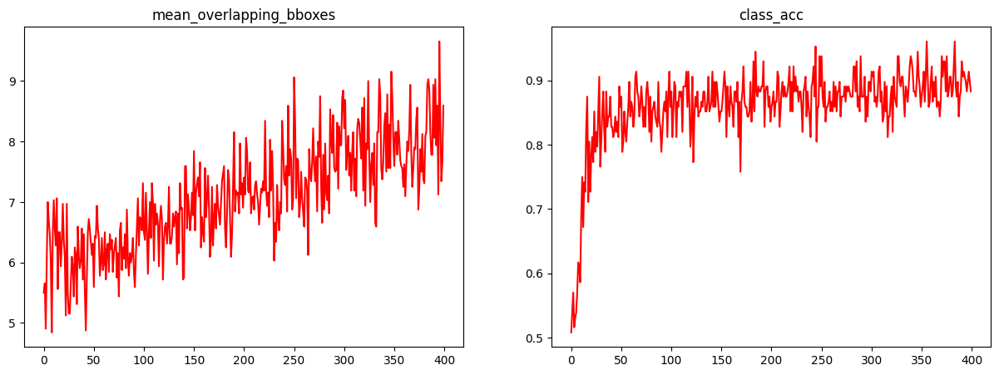

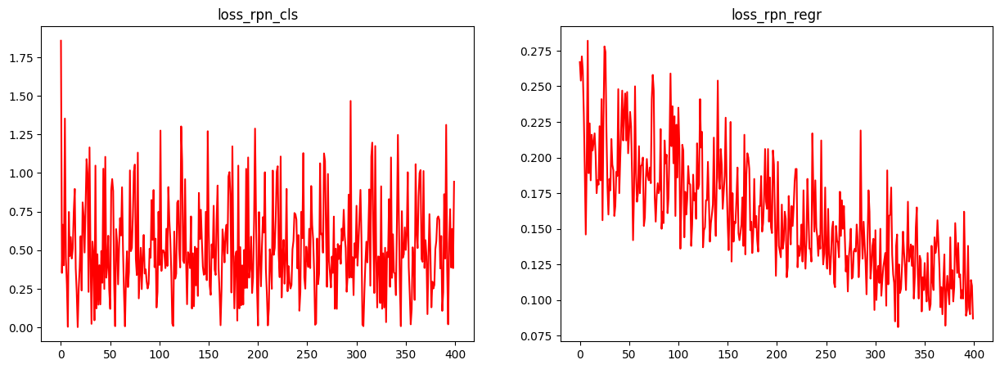

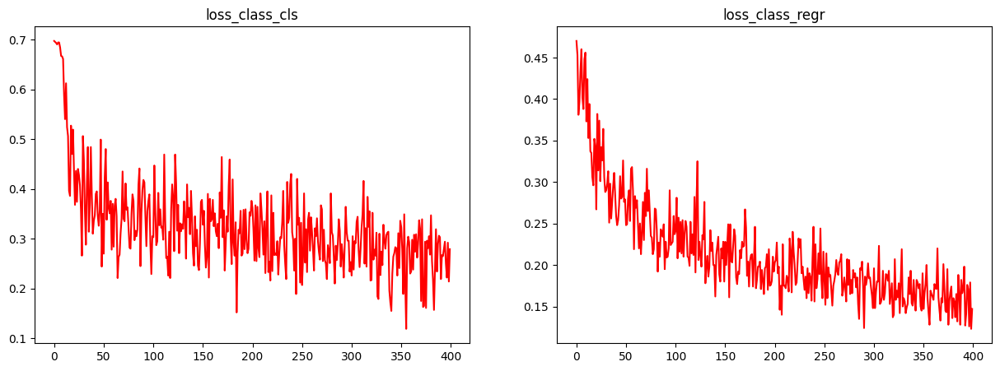

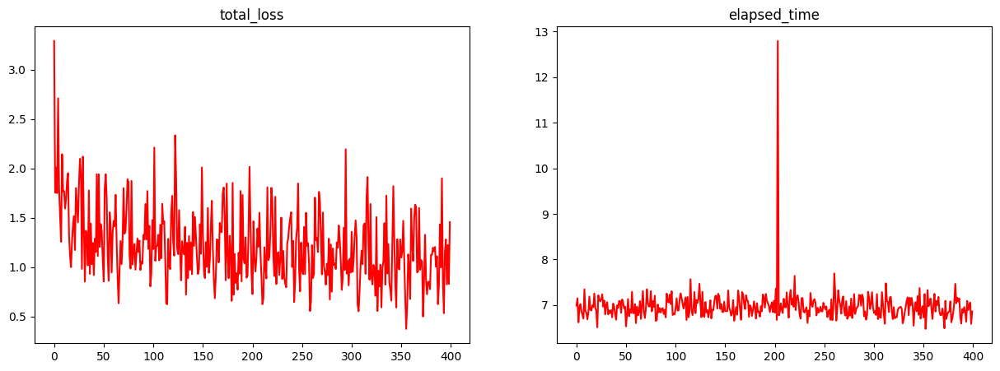

In [19]:
# Load the records
record_df = pd.read_csv(C.record_path)

r_epochs = len(record_df)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['mean_overlapping_bboxes'], 'r')
plt.title('mean_overlapping_bboxes')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['class_acc'], 'r')
plt.title('class_acc')

plt.show()

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_cls'], 'r')
plt.title('loss_rpn_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_rpn_regr'], 'r')
plt.title('loss_rpn_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_cls'], 'r')
plt.title('loss_class_cls')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['loss_class_regr'], 'r')
plt.title('loss_class_regr')
plt.show()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(np.arange(0, r_epochs), record_df['curr_loss'], 'r')
plt.title('total_loss')

plt.subplot(1,2,2)
plt.plot(np.arange(0, r_epochs), record_df['elapsed_time'], 'r')
plt.title('elapsed_time')

plt.show()

In [20]:
import keras.backend as K

# Set learning phase to 0 (inference mode)
K.set_learning_phase(0)

# Test

In [21]:
def format_img_size(img, C):
	""" formats the image size based on config """
	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
		
	if width <= height:
		ratio = img_min_side/width
		new_height = int(ratio * height)
		new_width = int(img_min_side)
	else:
		ratio = img_min_side/height
		new_width = int(ratio * width)
		new_height = int(img_min_side)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	return img, ratio	

def format_img_channels(img, C):
	""" formats the image channels based on config """
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	img = np.transpose(img, (2, 0, 1))
	img = np.expand_dims(img, axis=0)
	return img

def format_img(img, C):
	""" formats an image for model prediction based on config """
	img, ratio = format_img_size(img, C)
	img = format_img_channels(img, C)
	return img, ratio

# Method to transform the coordinates of the bounding box to its original size
def get_real_coordinates(ratio, x1, y1, x2, y2):

	real_x1 = int(round(x1 // ratio))
	real_y1 = int(round(y1 // ratio))
	real_x2 = int(round(x2 // ratio))
	real_y2 = int(round(y2 // ratio))

	return (real_x1, real_y1, real_x2 ,real_y2)

In [22]:
num_features = 512

input_shape_img = (None, None, 3)
input_shape_features = (None, None, num_features)

img_input = Input(shape=input_shape_img)
roi_input = Input(shape=(C.num_rois, 4))
feature_map_input = Input(shape=input_shape_features)

# define the base network (VGG here, can be Resnet50, Inception, etc)
shared_layers = nn_base(img_input, trainable=True)

# define the RPN, built on the base layers
num_anchors = len(C.anchor_box_scales) * len(C.anchor_box_ratios)
rpn_layers = rpn_layer(shared_layers, num_anchors)

classifier = classifier_layer(feature_map_input, roi_input, C.num_rois, nb_classes=len(C.class_mapping))

model_rpn = Model(img_input, rpn_layers)
model_classifier_only = Model([feature_map_input, roi_input], classifier)

model_classifier = Model([feature_map_input, roi_input], classifier)

print('Loading weights from {}'.format(C.model_path))
model_rpn.load_weights(C.model_path, by_name=True)
model_classifier.load_weights(C.model_path, by_name=True)

model_rpn.compile(optimizer='sgd', loss='mse')
model_classifier.compile(optimizer='sgd', loss='mse')





Loading weights from C:\Users\Lenovo\Documents\TA-2025-01\\model_frcnn_vgg.hdf5









In [23]:
# Switch key value for class mapping
class_mapping = C.class_mapping
class_mapping = {v: k for k, v in class_mapping.items()}
print(class_mapping)
class_to_color = {class_mapping[v]: np.random.randint(0, 255, 3) for v in class_mapping}

{0: 'Mobil', 1: 'bg'}


In [24]:
test_imgs = os.listdir(test_base_path)

imgs_path = []
for i in range(12):
	idx = np.random.randint(len(test_imgs))
	imgs_path.append(test_imgs[idx])

all_imgs = []

classes = {}

#### Measure mAP

In [25]:
def get_map(pred, gt, f):
	T = {}
	P = {}
	fx, fy = f

	for bbox in gt:
		bbox['bbox_matched'] = False

	pred_probs = np.array([s['prob'] for s in pred])
	box_idx_sorted_by_prob = np.argsort(pred_probs)[::-1]

	for box_idx in box_idx_sorted_by_prob:
		pred_box = pred[box_idx]
		pred_class = pred_box['class']
		pred_x1 = pred_box['x1']
		pred_x2 = pred_box['x2']
		pred_y1 = pred_box['y1']
		pred_y2 = pred_box['y2']
		pred_prob = pred_box['prob']
		if pred_class not in P:
			P[pred_class] = []
			T[pred_class] = []
		P[pred_class].append(pred_prob)
		found_match = False

		for gt_box in gt:
			gt_class = gt_box['class']
			gt_x1 = gt_box['x1']/fx
			gt_x2 = gt_box['x2']/fx
			gt_y1 = gt_box['y1']/fy
			gt_y2 = gt_box['y2']/fy
			gt_seen = gt_box['bbox_matched']
			if gt_class != pred_class:
				continue
			if gt_seen:
				continue
			iou_map = iou((pred_x1, pred_y1, pred_x2, pred_y2), (gt_x1, gt_y1, gt_x2, gt_y2))
			if iou_map >= 0.5:
				found_match = True
				gt_box['bbox_matched'] = True
				break
			else:
				continue

		T[pred_class].append(int(found_match))

	for gt_box in gt:
		if not gt_box['bbox_matched']:# and not gt_box['difficult']:
			if gt_box['class'] not in P:
				P[gt_box['class']] = []
				T[gt_box['class']] = []

			T[gt_box['class']].append(1)
			P[gt_box['class']].append(0)

	#import pdb
	#pdb.set_trace()
	return T, P

In [26]:
def format_img_map(img, C):
	"""Format image for mAP. Resize original image to C.im_size (300 in here)

	Args:
		img: cv2 image
		C: config

	Returns:
		img: Scaled and normalized image with expanding dimension
		fx: ratio for width scaling
		fy: ratio for height scaling
	"""

	img_min_side = float(C.im_size)
	(height,width,_) = img.shape
	
	if width <= height:
		f = img_min_side/width
		new_height = int(f * height)
		new_width = int(img_min_side)
	else:
		f = img_min_side/height
		new_width = int(f * width)
		new_height = int(img_min_side)
	fx = width/float(new_width)
	fy = height/float(new_height)
	img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_CUBIC)
	# Change image channel from BGR to RGB
	img = img[:, :, (2, 1, 0)]
	img = img.astype(np.float32)
	img[:, :, 0] -= C.img_channel_mean[0]
	img[:, :, 1] -= C.img_channel_mean[1]
	img[:, :, 2] -= C.img_channel_mean[2]
	img /= C.img_scaling_factor
	# Change img shape from (height, width, channel) to (channel, height, width)
	img = np.transpose(img, (2, 0, 1))
	# Expand one dimension at axis 0
	# img shape becames (1, channel, height, width)
	img = np.expand_dims(img, axis=0)
	return img, fx, fy

In [27]:
print(class_mapping)

{0: 'Mobil', 1: 'bg'}


In [28]:
# This might takes a while to parser the data
test_imgs, classes_count, class_mapping = get_data(test_path)

Parsing annotation files
idx=5422

In [29]:
# Ambil class_mapping dari konfigurasi
class_mapping = C.class_mapping  

# Pastikan tidak ada kesalahan dalam struktur class_mapping
if isinstance(list(class_mapping.keys())[0], str):  # Jika key adalah string (nama kelas)
    class_mapping = {v: k for k, v in class_mapping.items()}  # Balikkan key dan value

# Debugging untuk memastikan pembalikan berhasil
print("Fixed class_mapping:", class_mapping)

# Membuat warna acak untuk setiap kelas
class_to_color = {v: np.random.randint(0, 255, 3) for v in class_mapping}


Fixed class_mapping: {0: 'Mobil', 1: 'bg'}


In [30]:
T = {}
P = {}
mAPs = []
for idx, img_data in enumerate(test_imgs):
    print('{}/{}'.format(idx,len(test_imgs)))
    st = time.time()
    filepath = img_data['filepath']

    img = cv2.imread(filepath)

    X, fx, fy = format_img_map(img, C)

    # Change X (img) shape from (1, channel, height, width) to (1, height, width, channel)
    X = np.transpose(X, (0, 2, 3, 1))

    # get the feature maps and output from the RPN
    [Y1, Y2, F] = model_rpn.predict(X)


    R = rpn_to_roi(Y1, Y2, C, 'channels_last', overlap_thresh=0.)

    # convert from (x1,y1,x2,y2) to (x,y,w,h)
    R[:, 2] -= R[:, 0]
    R[:, 3] -= R[:, 1]

    # apply the spatial pyramid pooling to the proposed regions
    bboxes = {}
    probs = {}

    for jk in range(R.shape[0] // C.num_rois + 1):
        ROIs = np.expand_dims(R[C.num_rois * jk:C.num_rois * (jk + 1), :], axis=0)
        if ROIs.shape[1] == 0:
            break

        if jk == R.shape[0] // C.num_rois:
            # pad R
            curr_shape = ROIs.shape
            target_shape = (curr_shape[0], C.num_rois, curr_shape[2])
            ROIs_padded = np.zeros(target_shape).astype(ROIs.dtype)
            ROIs_padded[:, :curr_shape[1], :] = ROIs
            ROIs_padded[0, curr_shape[1]:, :] = ROIs[0, 0, :]
            ROIs = ROIs_padded

        [P_cls, P_regr] = model_classifier_only.predict([F, ROIs])

        # Calculate all classes' bboxes coordinates on resized image (300, 400)
        # Drop 'bg' classes bboxes
        for ii in range(P_cls.shape[1]):

            # If class name is 'bg', continue
            if np.argmax(P_cls[0, ii, :]) == (P_cls.shape[2] - 1):
                continue

            # Get class name
            cls_name = class_mapping[np.argmax(P_cls[0, ii, :])]

            if cls_name not in bboxes:
                bboxes[cls_name] = []
                probs[cls_name] = []

            (x, y, w, h) = ROIs[0, ii, :]

            cls_num = np.argmax(P_cls[0, ii, :])
            try:
                (tx, ty, tw, th) = P_regr[0, ii, 4 * cls_num:4 * (cls_num + 1)]
                tx /= C.classifier_regr_std[0]
                ty /= C.classifier_regr_std[1]
                tw /= C.classifier_regr_std[2]
                th /= C.classifier_regr_std[3]
                x, y, w, h = roi_helpers.apply_regr(x, y, w, h, tx, ty, tw, th)
            except:
                pass
            bboxes[cls_name].append([16 * x, 16 * y, 16 * (x + w), 16 * (y + h)])
            probs[cls_name].append(np.max(P_cls[0, ii, :]))

    all_dets = []

    for key in bboxes:
        bbox = np.array(bboxes[key])

        # Apply non-max-suppression on final bboxes to get the output bounding boxe
        new_boxes, new_probs = non_max_suppression_fast(bbox, np.array(probs[key]), overlap_thresh=0.5)
        for jk in range(new_boxes.shape[0]):
            (x1, y1, x2, y2) = new_boxes[jk, :]
            det = {'x1': x1, 'x2': x2, 'y1': y1, 'y2': y2, 'class': key, 'prob': new_probs[jk]}
            all_dets.append(det)


    print('Elapsed time = {}'.format(time.time() - st))
    t, p = get_map(all_dets, img_data['bboxes'], (fx, fy))
    for key in t.keys():
        if key not in T:
            T[key] = []
            P[key] = []
        T[key].extend(t[key])
        P[key].extend(p[key])
    all_aps = []
    for key in T.keys():
        ap = average_precision_score(T[key], P[key])
        print('{} AP: {}'.format(key, ap))
        all_aps.append(ap)
    print('mAP = {}'.format(np.mean(np.array(all_aps))))
    mAPs.append(np.mean(np.array(all_aps)))
    #print(T)
    #print(P)
    
print()
print('mean average precision:', np.mean(np.array(mAPs)))

0/1018
Elapsed time = 3.713996410369873
Mobil AP: 0.5714285714285714
mAP = 0.5714285714285714
1/1018
Elapsed time = 3.102468967437744
Mobil AP: 0.6363636363636364
mAP = 0.6363636363636364
2/1018
Elapsed time = 3.2197484970092773
Mobil AP: 0.5333333333333333
mAP = 0.5333333333333333
3/1018
Elapsed time = 3.05635142326355
Mobil AP: 0.6111111111111112
mAP = 0.6111111111111112
4/1018
Elapsed time = 2.7782390117645264
Mobil AP: 0.6666666666666666
mAP = 0.6666666666666666
5/1018
Elapsed time = 2.4226291179656982
Mobil AP: 0.7575757575757576
mAP = 0.7575757575757576
6/1018
Elapsed time = 3.333052396774292
Mobil AP: 0.7948717948717948
mAP = 0.7948717948717948
7/1018
Elapsed time = 3.344043254852295
Mobil AP: 0.8085106382978723
mAP = 0.8085106382978723
8/1018
Elapsed time = 3.249074935913086
Mobil AP: 0.8333333333333334
mAP = 0.8333333333333334
9/1018
Elapsed time = 2.940599203109741
Mobil AP: 0.8392857142857143
mAP = 0.8392857142857143
10/1018
Elapsed time = 3.1360275745391846
Mobil AP: 0.8550

Elapsed time = 3.257075071334839
Mobil AP: 0.8934579439252337
mAP = 0.8934579439252337
88/1018
Elapsed time = 3.381899356842041
Mobil AP: 0.8915441176470589
mAP = 0.8915441176470589
89/1018
Elapsed time = 3.16300106048584
Mobil AP: 0.8923357664233577
mAP = 0.8923357664233577
90/1018
Elapsed time = 3.1744861602783203
Mobil AP: 0.8929219600725953
mAP = 0.8929219600725953
91/1018
Elapsed time = 3.237903118133545
Mobil AP: 0.8924731182795699
mAP = 0.8924731182795699
92/1018
Elapsed time = 3.1397805213928223
Mobil AP: 0.8934280639431617
mAP = 0.8934280639431617
93/1018
Elapsed time = 3.067338228225708
Mobil AP: 0.8941798941798942
mAP = 0.8941798941798942
94/1018
Elapsed time = 3.170487403869629
Mobil AP: 0.8945518453427065
mAP = 0.8945518453427065
95/1018
Elapsed time = 3.1414051055908203
Mobil AP: 0.8949211908931699
mAP = 0.8949211908931699
96/1018
Elapsed time = 3.46152663230896
Mobil AP: 0.8937282229965157
mAP = 0.8937282229965157
97/1018
Elapsed time = 3.1156716346740723
Mobil AP: 0.894

Elapsed time = 3.071082592010498
Mobil AP: 0.8843322818086226
mAP = 0.8843322818086226
174/1018
Elapsed time = 3.0491106510162354
Mobil AP: 0.8850574712643678
mAP = 0.8850574712643678
175/1018
Elapsed time = 3.034409761428833
Mobil AP: 0.8855359001040582
mAP = 0.8855359001040582
176/1018
Elapsed time = 3.0982353687286377
Mobil AP: 0.8850931677018633
mAP = 0.8850931677018633
177/1018
Elapsed time = 3.275679349899292
Mobil AP: 0.881808838643371
mAP = 0.881808838643371
178/1018
Elapsed time = 2.1368935108184814
Mobil AP: 0.8828920570264766
mAP = 0.8828920570264766
179/1018
Elapsed time = 2.1516425609588623
Mobil AP: 0.8829465186680121
mAP = 0.8829465186680121
180/1018
Elapsed time = 1.9933829307556152
Mobil AP: 0.8826479438314945
mAP = 0.8826479438314945
181/1018
Elapsed time = 1.684394359588623
Mobil AP: 0.883
mAP = 0.883
182/1018
Elapsed time = 92.03672552108765
Mobil AP: 0.8831168831168831
mAP = 0.8831168831168831
183/1018
Elapsed time = 1.995302438735962
Mobil AP: 0.8835820895522388
m

Elapsed time = 3.174647092819214
Mobil AP: 0.8855013550135501
mAP = 0.8855013550135501
260/1018
Elapsed time = 3.2589259147644043
Mobil AP: 0.8865771812080537
mAP = 0.8865771812080537
261/1018
Elapsed time = 3.0874786376953125
Mobil AP: 0.8864395457581831
mAP = 0.8864395457581831
262/1018
Elapsed time = 3.1861228942871094
Mobil AP: 0.8847435043304464
mAP = 0.8847435043304464
263/1018
Elapsed time = 3.0251305103302
Mobil AP: 0.8850498338870432
mAP = 0.8850498338870432
264/1018
Elapsed time = 2.9666125774383545
Mobil AP: 0.8855820105820106
mAP = 0.8855820105820106
265/1018
Elapsed time = 3.082463264465332
Mobil AP: 0.8858267716535433
mAP = 0.8858267716535433
266/1018
Elapsed time = 3.2379298210144043
Mobil AP: 0.8859764089121888
mAP = 0.8859764089121888
267/1018
Elapsed time = 3.316432237625122
Mobil AP: 0.8852672750977836
mAP = 0.8852672750977836
268/1018
Elapsed time = 3.2590487003326416
Mobil AP: 0.8849385908209437
mAP = 0.8849385908209437
269/1018
Elapsed time = 3.213104724884033
Mob

Elapsed time = 3.0720784664154053
Mobil AP: 0.8895169578622816
mAP = 0.8895169578622816
346/1018
Elapsed time = 3.2606194019317627
Mobil AP: 0.8898565573770492
mAP = 0.8898565573770492
347/1018
Elapsed time = 3.1647355556488037
Mobil AP: 0.8899643402954661
mAP = 0.8899643402954661
348/1018
Elapsed time = 3.0958216190338135
Mobil AP: 0.8901322482197355
mAP = 0.8901322482197355
349/1018
Elapsed time = 3.0648930072784424
Mobil AP: 0.8900709219858156
mAP = 0.8900709219858156
350/1018
Elapsed time = 3.177067756652832
Mobil AP: 0.8903486609398686
mAP = 0.8903486609398686
351/1018
Elapsed time = 3.258418560028076
Mobil AP: 0.8907351460221551
mAP = 0.8907351460221551
352/1018
Elapsed time = 3.304755210876465
Mobil AP: 0.889894419306184
mAP = 0.889894419306184
353/1018
Elapsed time = 3.2841057777404785
Mobil AP: 0.8904452226113057
mAP = 0.8904452226113057
354/1018
Elapsed time = 3.1854708194732666
Mobil AP: 0.8892768079800498
mAP = 0.8892768079800498
355/1018
Elapsed time = 3.1576809883117676
M

Elapsed time = 2.9414782524108887
Mobil AP: 0.8879902951880307
mAP = 0.8879902951880307
432/1018
Elapsed time = 2.7972264289855957
Mobil AP: 0.888080808080808
mAP = 0.888080808080808
433/1018
Elapsed time = 2.843087911605835
Mobil AP: 0.8883064516129032
mAP = 0.8883064516129032
434/1018
Elapsed time = 3.0190277099609375
Mobil AP: 0.8880837359098228
mAP = 0.8880837359098228
435/1018
Elapsed time = 3.0457985401153564
Mobil AP: 0.8878617363344051
mAP = 0.8878617363344051
436/1018
Elapsed time = 3.0541462898254395
Mobil AP: 0.8881763527054108
mAP = 0.8881763527054108
437/1018
Elapsed time = 3.0313074588775635
Mobil AP: 0.888622754491018
mAP = 0.888622754491018
438/1018
Elapsed time = 3.149637460708618
Mobil AP: 0.8886671987230647
mAP = 0.8886671987230647
439/1018
Elapsed time = 2.9232804775238037
Mobil AP: 0.8892417626042081
mAP = 0.8892417626042081
440/1018
Elapsed time = 3.0254087448120117
Mobil AP: 0.8892857142857142
mAP = 0.8892857142857142
441/1018
Elapsed time = 3.164935827255249
Mob

Elapsed time = 2.8937392234802246
Mobil AP: 0.885669567415805
mAP = 0.885669567415805
518/1018
Elapsed time = 3.250272750854492
Mobil AP: 0.8855653848416088
mAP = 0.8855653848416088
519/1018
Elapsed time = 2.8887436389923096
Mobil AP: 0.8855374166006789
mAP = 0.8855374166006789
520/1018
Elapsed time = 3.06793475151062
Mobil AP: 0.8858019296658219
mAP = 0.8858019296658219
521/1018
Elapsed time = 2.954969644546509
Mobil AP: 0.8855851147780176
mAP = 0.8855851147780176
522/1018
Elapsed time = 3.191091537475586
Mobil AP: 0.8860361433186342
mAP = 0.8860361433186342
523/1018
Elapsed time = 3.07377552986145
Mobil AP: 0.8862230241040602
mAP = 0.8862230241040602
524/1018
Elapsed time = 3.196706533432007
Mobil AP: 0.886193655116139
mAP = 0.886193655116139
525/1018
Elapsed time = 2.933892250061035
Mobil AP: 0.8865277131019975
mAP = 0.8865277131019975
526/1018
Elapsed time = 3.082063913345337
Mobil AP: 0.886061223666236
mAP = 0.886061223666236
527/1018
Elapsed time = 3.0193841457366943
Mobil AP: 0.

Elapsed time = 3.3083345890045166
Mobil AP: 0.8849335792053322
mAP = 0.8849335792053322
604/1018
Elapsed time = 2.8946170806884766
Mobil AP: 0.8849665956733231
mAP = 0.8849665956733231
605/1018
Elapsed time = 2.9097986221313477
Mobil AP: 0.8850655314930184
mAP = 0.8850655314930184
606/1018
Elapsed time = 2.761671304702759
Mobil AP: 0.885108165238986
mAP = 0.885108165238986
607/1018
Elapsed time = 3.238481283187866
Mobil AP: 0.8850523163971735
mAP = 0.8850523163971735
608/1018
Elapsed time = 2.841254949569702
Mobil AP: 0.8851178674048068
mAP = 0.8851178674048068
609/1018
Elapsed time = 3.0563559532165527
Mobil AP: 0.8852160538554877
mAP = 0.8852160538554877
610/1018
Elapsed time = 3.2915406227111816
Mobil AP: 0.8854119241154889
mAP = 0.8854119241154889
611/1018
Elapsed time = 3.128089189529419
Mobil AP: 0.885574639418117
mAP = 0.885574639418117
612/1018
Elapsed time = 3.136218309402466
Mobil AP: 0.8855182291431264
mAP = 0.8855182291431264
613/1018
Elapsed time = 3.172992467880249
Mobil 

Elapsed time = 2.751275062561035
Mobil AP: 0.8858690380874761
mAP = 0.8858690380874761
689/1018
Elapsed time = 3.1798524856567383
Mobil AP: 0.885541674486157
mAP = 0.885541674486157
690/1018
Elapsed time = 2.536909580230713
Mobil AP: 0.8856555033484098
mAP = 0.8856555033484098
691/1018
Elapsed time = 2.938493251800537
Mobil AP: 0.88577606447835
mAP = 0.88577606447835
692/1018
Elapsed time = 2.874845504760742
Mobil AP: 0.885754742231552
mAP = 0.885754742231552
693/1018
Elapsed time = 2.876772880554199
Mobil AP: 0.8858958512768313
mAP = 0.8858958512768313
694/1018
Elapsed time = 3.054893732070923
Mobil AP: 0.8861489710905677
mAP = 0.8861489710905677
695/1018
Elapsed time = 3.131883144378662
Mobil AP: 0.8859931741073642
mAP = 0.8859931741073642
696/1018
Elapsed time = 2.9186882972717285
Mobil AP: 0.8860491817143273
mAP = 0.8860491817143273
697/1018
Elapsed time = 2.8920185565948486
Mobil AP: 0.886244775729234
mAP = 0.886244775729234
698/1018
Elapsed time = 3.4552414417266846
Mobil AP: 0.8

Elapsed time = 3.2945005893707275
Mobil AP: 0.883682402452003
mAP = 0.883682402452003
775/1018
Elapsed time = 3.0350725650787354
Mobil AP: 0.8833547754384541
mAP = 0.8833547754384541
776/1018
Elapsed time = 3.22637677192688
Mobil AP: 0.8827973651694914
mAP = 0.8827973651694914
777/1018
Elapsed time = 3.3699166774749756
Mobil AP: 0.8823443840090809
mAP = 0.8823443840090809
778/1018
Elapsed time = 3.4440908432006836
Mobil AP: 0.8820605574997948
mAP = 0.8820605574997948
779/1018
Elapsed time = 3.2217440605163574
Mobil AP: 0.8819965180084075
mAP = 0.8819965180084075
780/1018
Elapsed time = 3.3074779510498047
Mobil AP: 0.8822286887861487
mAP = 0.8822286887861487
781/1018
Elapsed time = 3.356464385986328
Mobil AP: 0.8820616438011084
mAP = 0.8820616438011084
782/1018
Elapsed time = 3.2138407230377197
Mobil AP: 0.8824981335837767
mAP = 0.8824981335837767
783/1018
Elapsed time = 3.4140262603759766
Mobil AP: 0.8825361094761686
mAP = 0.8825361094761686
784/1018
Elapsed time = 3.1038269996643066
M

Elapsed time = 3.085278272628784
Mobil AP: 0.8852327981089556
mAP = 0.8852327981089556
860/1018
Elapsed time = 2.9487664699554443
Mobil AP: 0.8853223823050319
mAP = 0.8853223823050319
861/1018
Elapsed time = 2.948805332183838
Mobil AP: 0.8851715167591162
mAP = 0.8851715167591162
862/1018
Elapsed time = 3.252716541290283
Mobil AP: 0.8849384955657952
mAP = 0.8849384955657952
863/1018
Elapsed time = 2.957939624786377
Mobil AP: 0.8849901391327875
mAP = 0.8849901391327875
864/1018
Elapsed time = 2.9458744525909424
Mobil AP: 0.8847133781842761
mAP = 0.8847133781842761
865/1018
Elapsed time = 3.022228956222534
Mobil AP: 0.8851371902456807
mAP = 0.8851371902456807
866/1018
Elapsed time = 3.0043017864227295
Mobil AP: 0.8849282599225701
mAP = 0.8849282599225701
867/1018
Elapsed time = 3.0541059970855713
Mobil AP: 0.8853049314669538
mAP = 0.8853049314669538
868/1018
Elapsed time = 3.2717645168304443
Mobil AP: 0.8853992448163729
mAP = 0.8853992448163729
869/1018
Elapsed time = 2.862969160079956
Mo

Elapsed time = 3.136347770690918
Mobil AP: 0.8823869546149651
mAP = 0.8823869546149651
946/1018
Elapsed time = 2.8174309730529785
Mobil AP: 0.8824491273530698
mAP = 0.8824491273530698
947/1018
Elapsed time = 3.139944314956665
Mobil AP: 0.8821582289241685
mAP = 0.8821582289241685
948/1018
Elapsed time = 3.1312994956970215
Mobil AP: 0.8821681349404964
mAP = 0.8821681349404964
949/1018
Elapsed time = 3.139720916748047
Mobil AP: 0.8821888503247202
mAP = 0.8821888503247202
950/1018
Elapsed time = 3.0140533447265625
Mobil AP: 0.8822302592502661
mAP = 0.8822302592502661
951/1018
Elapsed time = 3.2707579135894775
Mobil AP: 0.8818482961347527
mAP = 0.8818482961347527
952/1018
Elapsed time = 2.9062626361846924
Mobil AP: 0.881869031293601
mAP = 0.881869031293601
953/1018
Elapsed time = 3.2021219730377197
Mobil AP: 0.8821585612333577
mAP = 0.8821585612333577
954/1018
Elapsed time = 3.226702928543091
Mobil AP: 0.8824877196583208
mAP = 0.8824877196583208
955/1018
Elapsed time = 2.845757246017456
Mob

In [31]:
mAP = [mAP for mAP in mAPs if str(mAP)!='nan']
mean_average_prec = round(np.mean(np.array(mAP)), 3)
print('After training %dk batches, the mean average precision is %0.3f'%(len(record_df), mean_average_prec))

# record_df.loc[len(record_df)-1, 'mAP'] = mean_average_prec
# record_df.to_csv(C.record_path, index=0)
# print('Save mAP to {}'.format(C.record_path))

After training 400k batches, the mean average precision is 0.884


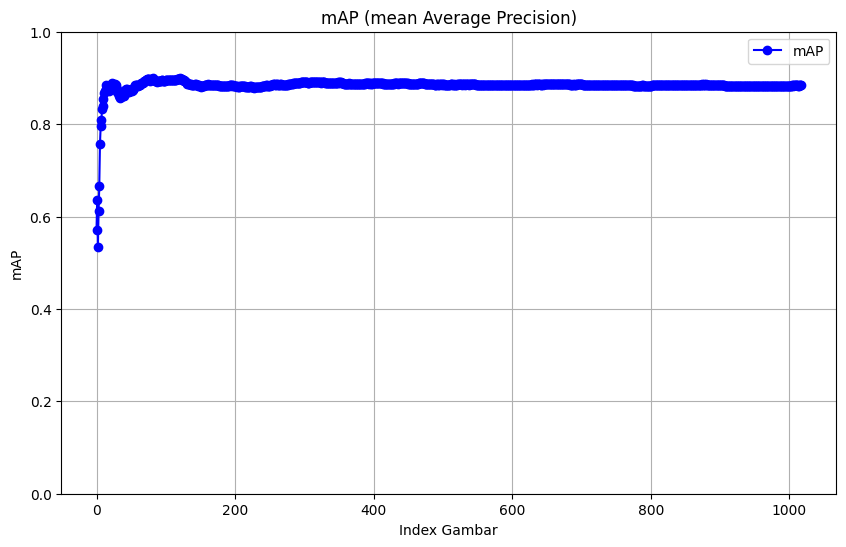

In [32]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(mAPs, marker='o', linestyle='-', color='blue', label='mAP')
plt.title('mAP (mean Average Precision)')
plt.xlabel('Index Gambar')
plt.ylabel('mAP')
plt.ylim(0, 1)
plt.grid(True)
plt.legend()
plt.show()


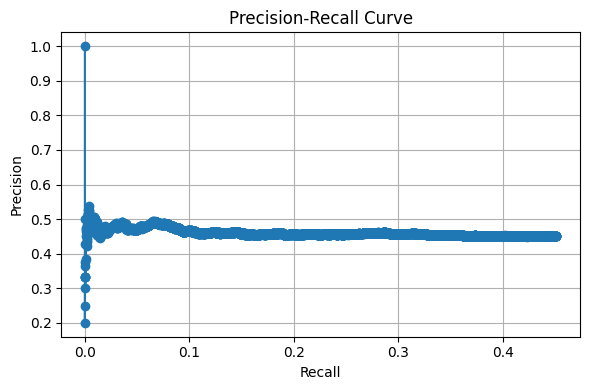

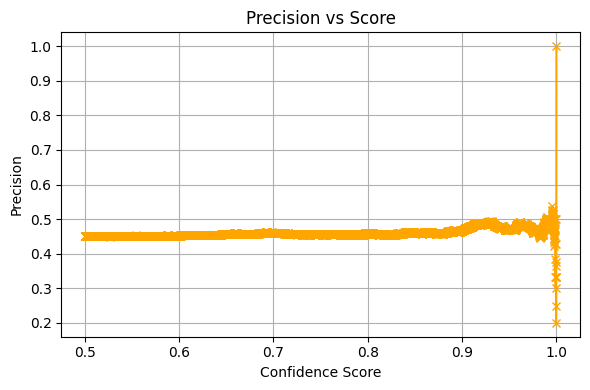

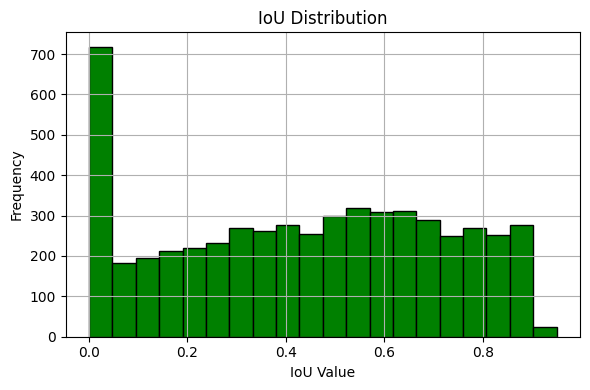

In [33]:
import os
import matplotlib.pyplot as plt
from collections import defaultdict
import numpy as np

# === Path dasar folder data ===
BASE_PATH = "C:/Users/Lenovo/Documents/TA-2025-01"
GROUND_TRUTH_FILE = os.path.join(BASE_PATH, "train annotation_normalized3.txt")

def load_ground_truth(filepath):
    gt = defaultdict(list)
    with open(filepath, "r") as f:
        for line in f:
            parts = line.strip().split(',')
            filename = parts[0].split('/')[-1]
            box = list(map(int, parts[1:5]))
            gt[filename].append(box)
    return gt

# === Prediksi dummy ===
def generate_dummy_predictions(gt_boxes, offset=5):
    preds = {}
    for filename, boxes in gt_boxes.items():
        preds[filename] = []
        for box in boxes:
            pred_box = [box[0] + offset, box[1] + offset, box[2] - offset, box[3] - offset]
            score = np.random.uniform(0.5, 1.0)
            preds[filename].append((pred_box, score))
    return preds

# === Precision, Recall, dan IoU ===
def compute_precision_recall(gt_boxes, pred_boxes, iou_threshold=0.5):
    all_scores = []
    all_matches = []
    all_ious = []

    for filename in pred_boxes:
        gt = gt_boxes.get(filename, [])
        preds = pred_boxes[filename]
        preds = sorted(preds, key=lambda x: x[1], reverse=True)
        matched_gt = [False] * len(gt)

        for pred_box, score in preds:
            max_iou = 0
            max_i = -1
            for i, gt_box in enumerate(gt):
                iou_val = iou(pred_box, gt_box)
                if iou_val > max_iou and not matched_gt[i]:
                    max_iou = iou_val
                    max_i = i

            all_ious.append(max_iou)
            if max_iou >= iou_threshold and max_i >= 0:
                matched_gt[max_i] = True
                all_scores.append(score)
                all_matches.append(1)
            else:
                all_scores.append(score)
                all_matches.append(0)

    sorted_idx = np.argsort(-np.array(all_scores))
    tp = np.array(all_matches)[sorted_idx]
    fp = 1 - tp
    cum_tp = np.cumsum(tp)
    cum_fp = np.cumsum(fp)
    precision = cum_tp / (cum_tp + cum_fp + 1e-6)
    recall = cum_tp / (len([g for v in gt_boxes.values() for g in v]) + 1e-6)

    return precision, recall, np.array(all_scores)[sorted_idx], np.array(all_ious)

# === Plot ===
def plot_precision_recall_curve(precision, recall):
    plt.figure(figsize=(6, 4))
    plt.plot(recall, precision, marker='o')
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_precision_vs_score(precision, scores):
    plt.figure(figsize=(6, 4))
    plt.plot(scores, precision, marker='x', color='orange')
    plt.xlabel("Confidence Score")
    plt.ylabel("Precision")
    plt.title("Precision vs Score")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def plot_iou_distribution(ious):
    plt.figure(figsize=(6, 4))
    plt.hist(ious, bins=20, color='green', edgecolor='black')
    plt.xlabel("IoU Value")
    plt.ylabel("Frequency")
    plt.title("IoU Distribution")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === Main ===
if __name__ == "__main__":
    gt_boxes = load_ground_truth(GROUND_TRUTH_FILE)
    pred_boxes = generate_dummy_predictions(gt_boxes)
    precision, recall, scores, ious = compute_precision_recall(gt_boxes, pred_boxes)

    # Plot 3 grafik terpisah
    plot_precision_recall_curve(precision, recall)
    plot_precision_vs_score(precision, scores)
    plot_iou_distribution(ious)


### TEST Faster Rcnn + FPN

Processing 00d7b63284dc4a9f82e0444df5c043be_jpg.rf.941f3bc91b335d263be0ec6da9d8bd18.jpg...


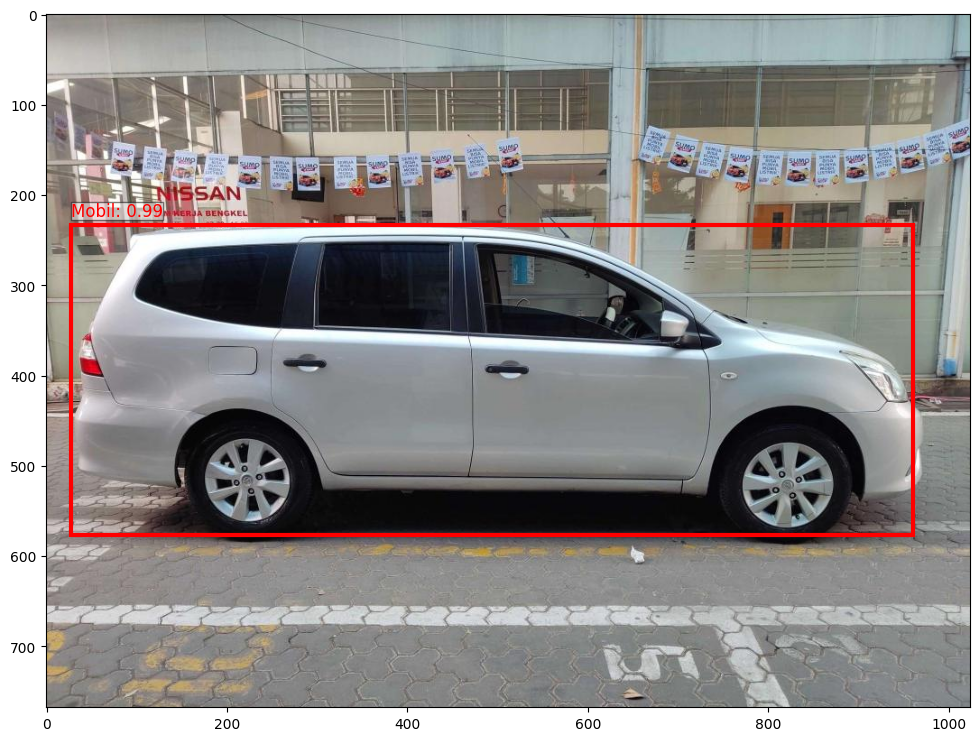

Processing 00d853163a8645eaa97aac706149b4ad_jpg.rf.ce365e81ba35cc2943b628dee7ff40a1.jpg...


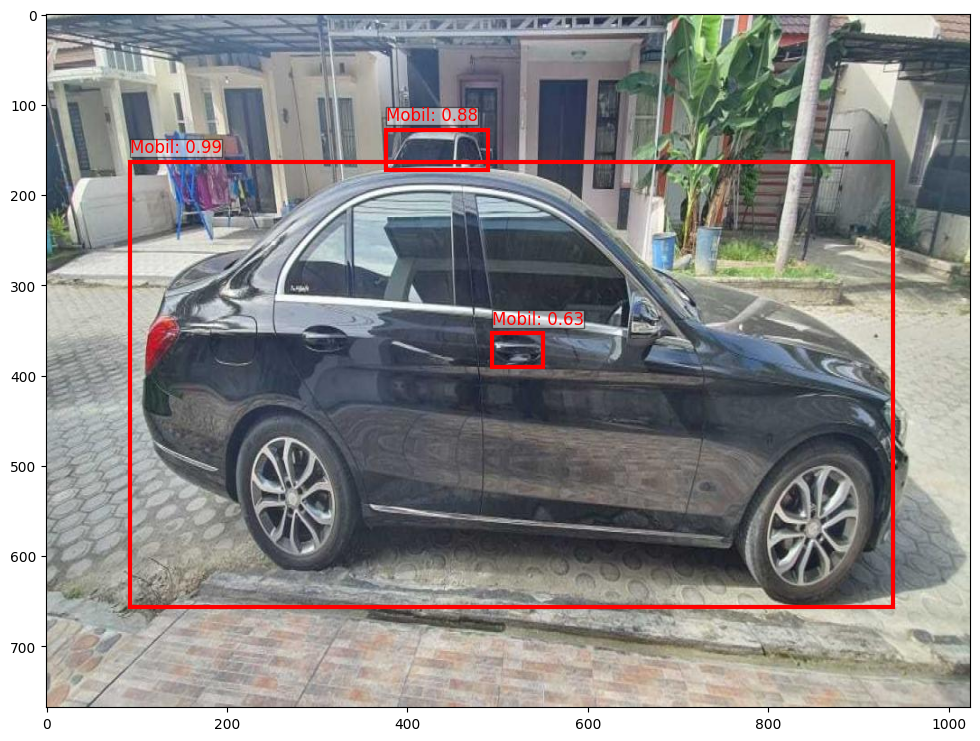

Processing 00dacc1743fa439bac871610f8a9a333_jpg.rf.14e733b00f4770614eb69ee34cdae683.jpg...


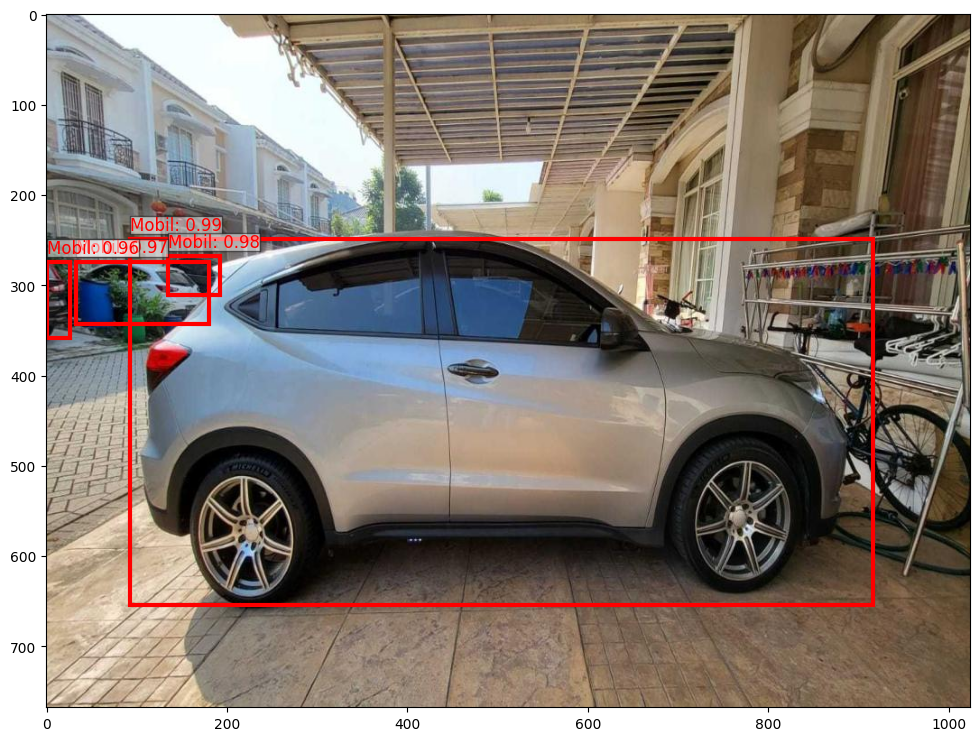

Processing 00db5e54991641fca9d430e7ae47af85_jpg.rf.22047dddec4af574eb696e39f418db42.jpg...


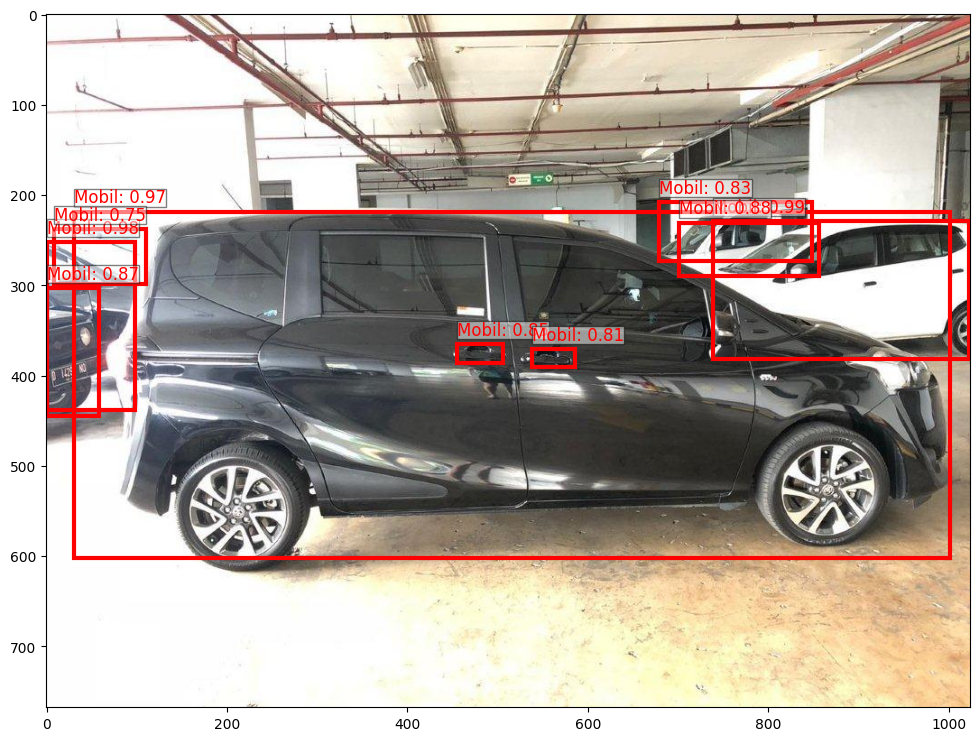

Processing 00de3a8c327e4ac5b5aea13040b4c449_jpg.rf.aa68af9486b464cdc73af7b38d201165.jpg...


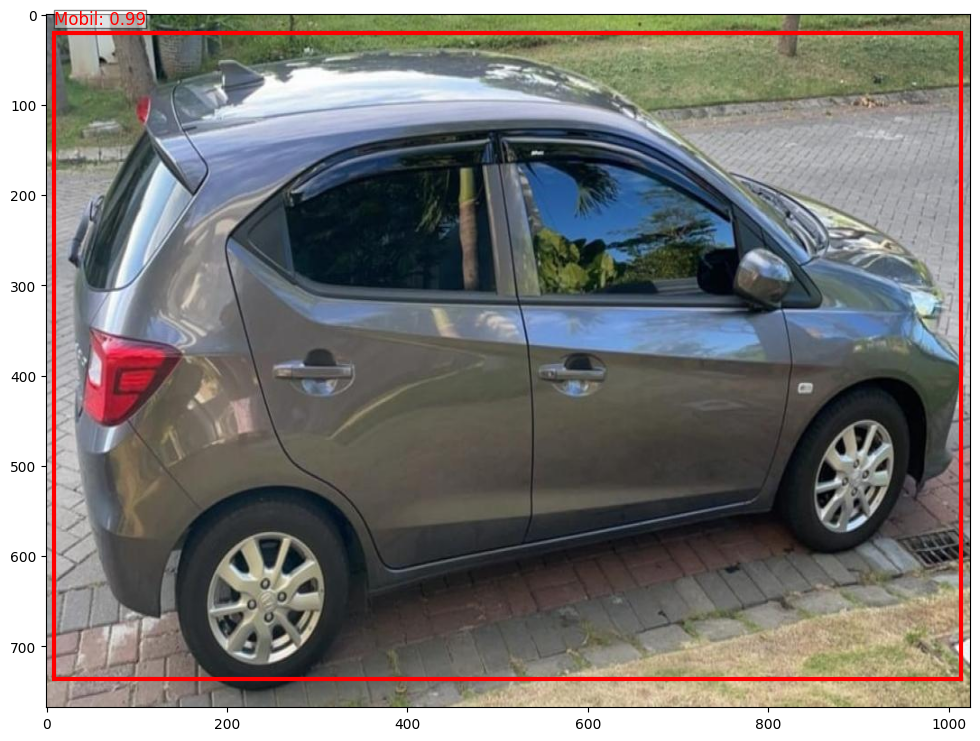

Processing 00dfc89b9a36441c9f0efa692e7d3ac5_jpg.rf.8736a781fe986955615912c724057c9a.jpg...


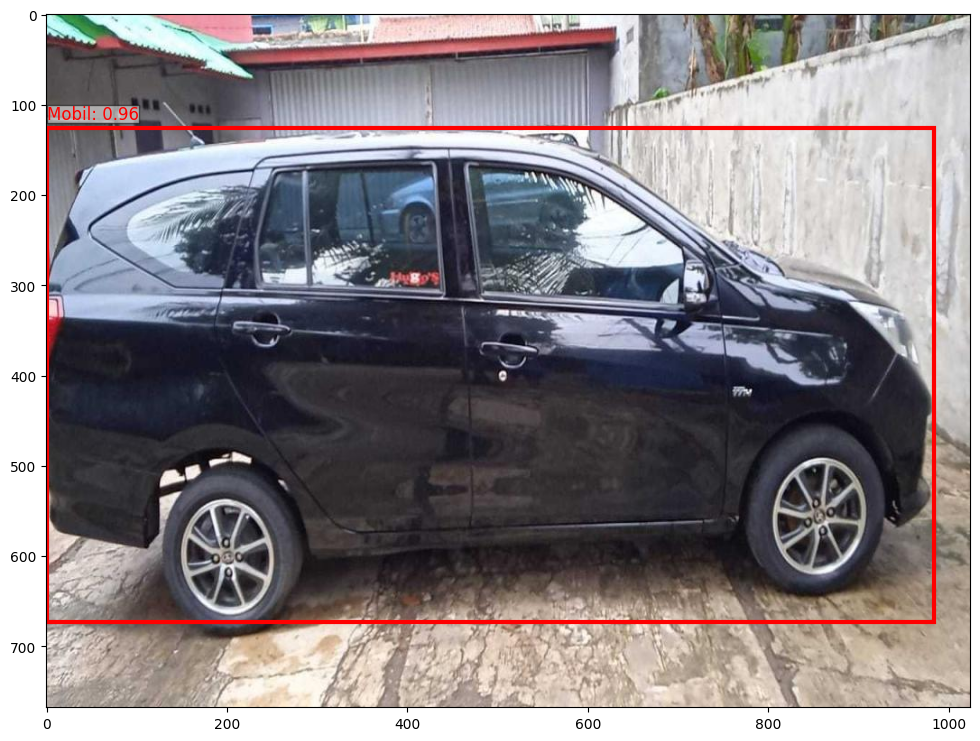

Processing img.jpg...


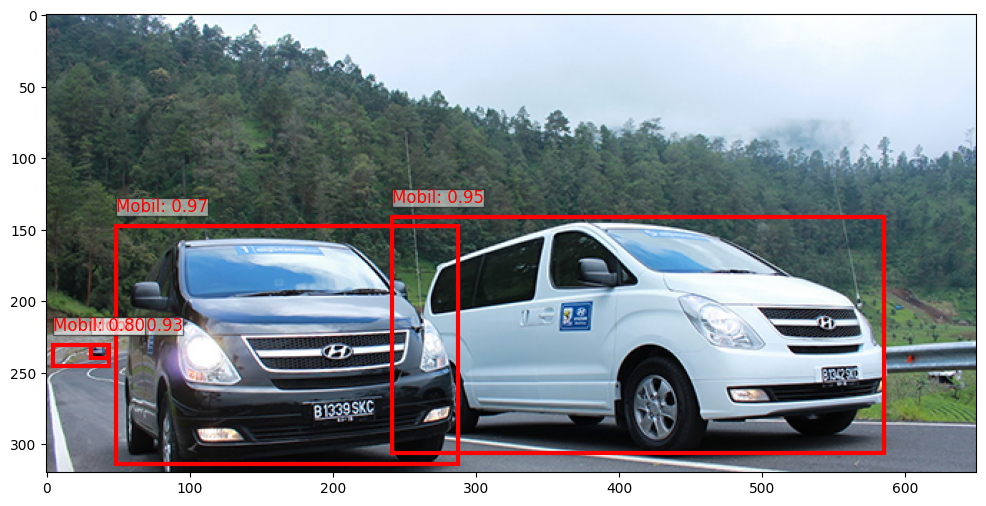

Processing img2.jpg...


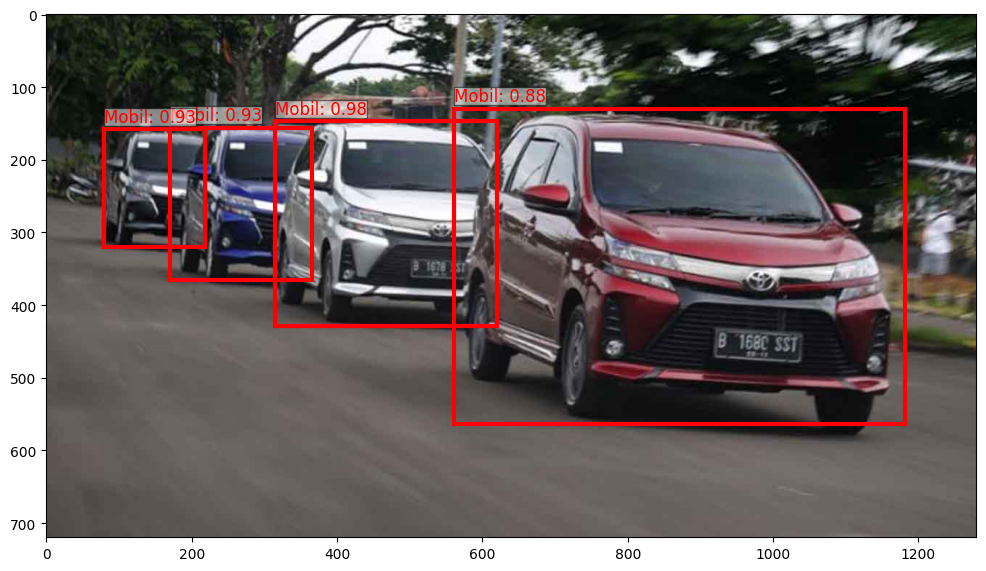

Processing img4.jpg...


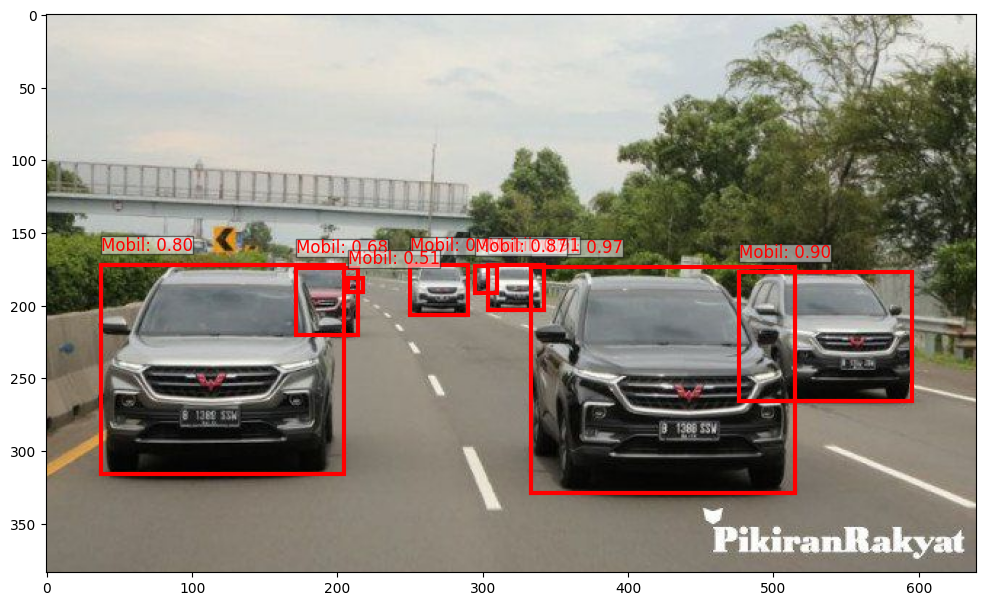

In [35]:


weights = FasterRCNN_Vgg16_FPN_Weights.DEFAULT
# Muat model dengan parameter 'weights' yang baru
model = models.detection.fasterrcnn_vgg16_fpn(weights=weights)
model.eval()

transform = weights.transforms()

# Fungsi untuk melakukan deteksi dan menampilkan hasil
def detect_and_plot(image_path):
    # Pemuatan gambar
    img = Image.open(image_path).convert("RGB") # Pastikan gambar dalam mode RGB

    # Transformasi untuk gambar (menggunakan transformasi dari weights)
    img_tensor = transform(img).unsqueeze(0)

    model.to(device)
    img_tensor = img_tensor.to(device)

    # Melakukan deteksi objek
    with torch.no_grad():
        prediction = model(img_tensor)

    # Mendapatkan hasil deteksi
    pred_boxes = prediction[0]['boxes']
    pred_labels = prediction[0]['labels']
    pred_scores = prediction[0]['scores']

    # Mendapatkan nama kelas dari metadata weights
    # Ini lebih aman daripada menggunakan angka '3' secara langsung
    categories = weights.meta["categories"]
    car_class_index = categories.index('car')

    car_boxes = pred_boxes[pred_labels == car_class_index]
    car_scores = pred_scores[pred_labels == car_class_index]

    # Menampilkan gambar dengan bounding boxes
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img)

    # Menambahkan bounding boxes dari model yang terdeteksi
    for i in range(len(car_boxes)):
        if car_scores[i] > 0.5:  # Hanya menampilkan yang memiliki skor > 0.5
            box = car_boxes[i].cpu().numpy()
            x_min, y_min, x_max, y_max = box
            rect = plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                 fill=False, color='red', linewidth=3)
            ax.add_patch(rect)
            # Menampilkan label dan skor di atas kotak
            ax.text(x_min, y_min - 10, f'Mobil: {car_scores[i]:.2f}', color='red',
                    fontsize=12, bbox=dict(facecolor='white', alpha=0.5, pad=0))

    plt.show()

# Fungsi untuk memproses semua gambar dalam folder
def process_folder(image_folder):
    for image_name in os.listdir(image_folder):
        if image_name.endswith(('.jpg', '.jpeg', '.png')):  # Filter file gambar
            image_path = os.path.join(image_folder, image_name)

            # Memastikan file gambar ada
            if os.path.exists(image_path):
                print(f"Processing {image_name}...")
                detect_and_plot(image_path)
            else:
                print(f"Image {image_name} not found!")

# Path ke folder gambar
image_folder = 'C:/Users/Lenovo/Documents/TA-2025-01/Image_Test'

# Memanggil fungsi untuk memproses semua gambar dalam folder
process_folder(image_folder)